# Fingerprint-based similarity scores - ranking task

## Challenge
Often, fingerprints are used to find best matches in a dataaset or library. In this case, only the top-ranked similarities matter and it is not really important if a pair of mostly dissimilar compounds is placed in the 20 or 30% lowest percent.
Data:

Compare multiple fingerprints on the "ms2structures" dataset.

In [ ]:
import os
import glob
import sys
from pathlib import Path
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import os

from rdkit import Chem
from rdkit.Chem import rdFingerprintGenerator

ROOT = Path(os.getcwd()).parents[0]
path_data = os.path.join(Path(ROOT), "data")

In [2]:
filename = "compounds_ms2structures.csv"
compounds = pd.read_csv(os.path.join(path_data, filename))
compounds.head()

,inchikey,smiles,mass,cf_class,cf_subclass,cf_superclass,formula,npc_class_results,npc_pathway_results,npc_superclass_results
0,AAAQFGUYHFJNHI,CCNC(=O)C[C@H]1C2=NN=C(N2C3=C(C=C(C=C3)OC)C(=N...,423.146204,Benzodiazepines,"1,4-benzodiazepines",Organoheterocyclic compounds,C22H22ClN5O2,NaN,Alkaloids,NaN
1,AABFWJDLCCDJJN,COC1=CC2=C(C=C1)NC3=C2C=CN=C3C4=CC=CC5=CC=CC=C54,324.126264,Harmala alkaloids,NaN,Alkaloids and derivatives,C22H16N2O,Carboline alkaloids,Alkaloids,Tryptophan alkaloids
2,AABILZKQMVKFHP,C/C=C(/C)\C(=O)O[C@H]1CC[N+]2([C@@H]1C(=CC2)CO...,427.220624,NaN,NaN,Alkaloids and derivatives,C21H33NO8,Pyrrolizidine alkaloids,Alkaloids,Ornithine alkaloids
3,AABUHSBGEIUSRJ,CC(=O)NC1=CC=C(C=C1)NC(=O)C=CC2=CC=CC=C2,280.120724,Cinnamic acids and derivatives,Cinnamic acid amides,Phenylpropanoids and polyketides,C17H16N2O2,Cinnamic acid amides,Shikimates and Phenylpropanoids,Phenylpropanoids (C6-C3)
4,AABUKWVVUWBZCS,C1=CC=C(C=C1)C2=C(C(=O)OC3=C2C=CC(=C3)O)C4=CC=...,314.094724,Neoflavonoids,Neoflavones,Phenylpropanoids and polyketides,C21H14O3,Neoflavonoids,Shikimates and Phenylpropanoids,Flavonoids


## Compute percentile scores and compare

In [ ]:
# Add source code path
sys.path.insert(0, os.path.join(ROOT, "src"))

# Import funtion/classes from source code
from fingerprint_computation import compute_fingerprints_from_smiles
from metrics import generalized_tanimoto_similarity_matrix_sparse, jaccard_similarity_matrix_sparse
from metrics import generalized_tanimoto_similarity_matrix, jaccard_similarity_matrix

from map4 import MAP4
# from mbp import MBP

In [5]:
from typing import List
from rdkit.Chem import Mol

def compute_map_fingerprints_from_smiles(smiles, map_generator):
    
    molecules: List[Mol] = [Chem.MolFromSmiles(s) for s in smiles]
    fingerprints_map: np.ndarray = map_generator.calculate_many(
        molecules,
        number_of_threads=32,
        verbose=True,
    )
    return list(fingerprints_map)


def compute_sparse_map_fingerprints_from_smiles(
    smiles,
    map_generator,
    count=False,
    ):
    molecules: List[Mol] = [Chem.MolFromSmiles(s) for s in smiles]
    fingerprints_map: np.ndarray = map_generator.calculate_many_sparse(
        molecules,
        number_of_threads=32,
        verbose=True,
        count=count,
    )
    return list(fingerprints_map)


def compute_sparse_map_fingerprints_from_smiles_serial(
        smiles,
        map_generator
        ):

    molecules: List[Mol] = [Chem.MolFromSmiles(s) for s in smiles]
    fingerprints = []
    for mol in tqdm(molecules):
        fp_bits = map_generator._calculate(mol)
        fingerprints.append(np.sort(map_generator.encoder.hash(fp_bits)))
    return fingerprints

In [6]:
experiments = [
    ("morgan2_count", rdFingerprintGenerator.GetMorganGenerator(radius=2, fpSize=4096), True),
    ("morgan3_count", rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=4096), True),
    ("morgan9_count", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=4096), True),
    ("morgan12_count", rdFingerprintGenerator.GetMorganGenerator(radius=12, fpSize=4096), True),
    ("morgan2_binary", rdFingerprintGenerator.GetMorganGenerator(radius=2, fpSize=4096), False),
    ("morgan3_binary", rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=4096), False),
    ("morgan9_binary", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=4096), False),
    ("morgan12_binary", rdFingerprintGenerator.GetMorganGenerator(radius=12, fpSize=4096), False),
    ("rdkit", rdFingerprintGenerator.GetRDKitFPGenerator(fpSize=4096), False),
    ("rdkit_count", rdFingerprintGenerator.GetRDKitFPGenerator(fpSize=4096), True),
    ("map2", MAP4(dimensions=4096, radius=1, include_duplicated_shingles=False), False),
    ("map4", MAP4(dimensions=4096, radius=2, include_duplicated_shingles=False), False),
    #("mbp2", MBP(dimensions=4096, radius=1), False),
    #("mbp2_binned", MBP(dimensions=4096, radius=1, dist_binning=np.array([0, 1, 2, 4, 8, 16, 32, 64])), False),
    #("mbp2_count", MBP(dimensions=4096, radius=1), True),
    #("mbp2_binned_count", MBP(dimensions=4096, radius=1, dist_binning=np.array([0, 1, 2, 4, 8, 16, 32, 64])), True),
    ("morgan2_count_sparse", rdFingerprintGenerator.GetMorganGenerator(radius=2, fpSize=4096), True),
    ("morgan3_count_sparse", rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=4096), True),
    ("morgan9_count_sparse", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=4096), True),
    ("morgan2_binary_sparse", rdFingerprintGenerator.GetMorganGenerator(radius=2, fpSize=4096), False),
    ("morgan3_binary_sparse", rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=4096), False),
    ("morgan9_binary_sparse", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=4096), False),
    ("morgan12_binary_sparse", rdFingerprintGenerator.GetMorganGenerator(radius=12, fpSize=4096), False),
    ("morgan12_count_sparse", rdFingerprintGenerator.GetMorganGenerator(radius=12, fpSize=4096), True),
    ("morgan3_logcount", rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=4096), True),
    ("morgan9_logcount", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=4096), True),
    ("morgan12_logcount", rdFingerprintGenerator.GetMorganGenerator(radius=12, fpSize=4096), True),
    ("morgan3_logcount_sparse", rdFingerprintGenerator.GetMorganGenerator(radius=3, fpSize=4096), True),
    ("morgan9_logcount_sparse", rdFingerprintGenerator.GetMorganGenerator(radius=9, fpSize=4096), True),
    ("morgan12_logcount_sparse", rdFingerprintGenerator.GetMorganGenerator(radius=12, fpSize=4096), True),
    ("rdkit_sparse", rdFingerprintGenerator.GetRDKitFPGenerator(fpSize=4096), False),
    ("rdkit_count_sparse", rdFingerprintGenerator.GetRDKitFPGenerator(fpSize=4096), True),
    ("map2_sparse", MAP4(dimensions=4096, radius=1, include_duplicated_shingles=False), False),
    ("map4_sparse", MAP4(dimensions=4096, radius=2, include_duplicated_shingles=False), False),
    #("mbp2_sparse", MBP(dimensions=4096, radius=1), False),
    #("mbp2_binned_sparse", MBP(dimensions=4096, radius=1, dist_binning=np.array([0, 1, 2, 4, 8, 16, 32, 64])), False),
    #("mbp2_count_sparse", MBP(dimensions=4096, radius=1), True),
    #("mbp2_binned_count_sparse", MBP(dimensions=4096, radius=1, dist_binning=np.array([0, 1, 2, 4, 8, 16, 32, 64])), True),
]

In [7]:
from scipy.stats import rankdata


def compute_scaled_vector(sim):
    """
    Given an unscaled similarity matrix `sim` (assumed symmetric), this function:
      1. Extracts the upper-triangular entries (excluding the diagonal).
      2. Computes the average ranks for these entries.
      3. Converts the ranks to a percentile scale [0, 100].
    
    Returns:
      iu1       : tuple of arrays (row indices, col indices) for the upper triangle (i < j)
      scaled_arr: 1D array of scaled similarity values (percentile scores).
    """
    N = sim.shape[0]
    iu1 = np.triu_indices(N, k=1)
    arr = sim[iu1]
    if arr.size > 1:
        ranks = rankdata(arr, method="average")
        scaled_arr = (ranks - 1) / (len(ranks) - 1) * 100
    else:
        scaled_arr = np.zeros_like(arr)
    return iu1, scaled_arr


In [8]:
path_results = os.path.join(Path(ROOT), "experiments")

In [ ]:
percentiles = np.linspace(0, 100, 201)
mass_low = 300
mass_high = 500

idx_low = np.where(compounds.mass < mass_low)[0]
idx_high = np.where(compounds.mass > mass_high)[0]
print(f"Compounds < {mass_low} Da: {idx_low.size}")
print(f"Compounds > {mass_high} Da: {idx_high.size}")

for experiment in experiments:
    (name, fpgen, count) = experiment

    results_filepath = os.path.join(path_results, f"cross_mass_percentiles_{name}.csv")
    if os.path.exists(results_filepath):
        print(f"----- Found existing results for experiment: {name} -----")
        print("----- (experiment will be skipped) -----")
        continue
    print(f"----- Experiment: {name} -----")

    if "_sparse" in name:
        if ("map" in name):
            fingerprints = compute_sparse_map_fingerprints_from_smiles_serial(compounds.smiles, fpgen)
        elif ("mbp" in name):
            if "count" in name:
                fingerprints = compute_sparse_map_fingerprints_from_smiles(compounds.smiles, fpgen, count=True)
            else:
                fingerprints = compute_sparse_map_fingerprints_from_smiles(compounds.smiles, fpgen)
        else:
            fingerprints = compute_fingerprints_from_smiles(
                compounds.smiles, fpgen, sparse=True,
                count=count, progress_bar=True
            )
        print(f"Collected {len(fingerprints)} sparse fingerprints.")

        if "count" in name:
            if "logcount" in name:
                fingerprints = [(a, np.log(1 + b)) for a, b in fingerprints]
            similarities = generalized_tanimoto_similarity_matrix_sparse(fingerprints, fingerprints)
        else:
            similarities = jaccard_similarity_matrix_sparse(fingerprints, fingerprints)
        
    else:
        if ("map" in name) or ("mbp" in name):
            fingerprints = compute_map_fingerprints_from_smiles(compounds.smiles, fpgen)
            fingerprints = np.stack(fingerprints)
        else:
            fingerprints = compute_fingerprints_from_smiles(
                compounds.smiles, fpgen, sparse=False,
                count=count, progress_bar=True
            )
            fingerprints = np.stack(fingerprints)
        print(f"Collected {fingerprints.shape[0]} fingerprints.")

        if "count" in name:
            if "logcount" in name:
                fingerprints = np.log(1 + fingerprints)
            similarities = generalized_tanimoto_similarity_matrix(fingerprints, fingerprints)
        else:
            similarities = jaccard_similarity_matrix(fingerprints, fingerprints)

    print(f"Computed {similarities.shape[0]} x {similarities.shape[1]} similarity scores")

    
    iu1, scaled_arr = compute_scaled_vector(similarities)
        
    # For each subgroup, we need the pairs (i,j) for which both indices belong to the subgroup.
    # Use np.isin on the row and column index arrays from the upper triangle.
    mask_low = np.isin(iu1[0], idx_low) & np.isin(iu1[1], idx_low)
    mask_high = np.isin(iu1[0], idx_high) & np.isin(iu1[1], idx_high)
    
    # Compute the percentile curves from the subgroup's scaled similarity values.
    if np.any(mask_low):
        perc_low_curve = np.percentile(scaled_arr[mask_low], percentiles)
    else:
        perc_low_curve = np.full(len(percentiles), np.nan)
        
    if np.any(mask_high):
        perc_high_curve = np.percentile(scaled_arr[mask_high], percentiles)
    else:
        perc_high_curve = np.full(len(percentiles), np.nan)
    
    pd.DataFrame({
        "percentiles": percentiles,
        "perc_high": perc_high_curve,
        "perc_low": perc_low_curve
    }).set_index("percentiles").to_csv(results_filepath, index=False)

Compounds < 300 Da: 8601
Compounds > 500 Da: 8570
----- Found existing results for experiment: morgan2_count -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan3_count -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan9_count -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan12_count -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan2_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan3_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan9_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan12_binary -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: rdkit -----
----- (experiment will be skipped) ----

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:36<00:00, 1032.00it/s]


Collected 37811 fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: map2 -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: map4 -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan2_count_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan3_count_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan9_count_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan2_binary_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan3_binary_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan9_binary_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: morgan12_

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37811/37811 [00:46<00:00, 814.12it/s]


Collected 37811 sparse fingerprints.
Computed 37811 x 37811 similarity scores
----- Found existing results for experiment: map2_sparse -----
----- (experiment will be skipped) -----
----- Found existing results for experiment: map4_sparse -----
----- (experiment will be skipped) -----


## Inspect results

In [ ]:
csv_pattern = os.path.join(path_results, "cross_mass_percentiles_*.csv")
csv_files = sorted(glob.glob(csv_pattern))

percentiles = np.linspace(0, 100, 201)

if not csv_files:
    print("No CSV files found in", path_results)
else:
    nfiles = len(csv_files)

    ncols = 4
    nrows = int(np.ceil(nfiles / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows), dpi=300)

    if nfiles == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    mean_differences = {}
    mean_differences_top50 = {}

    for ax, csv_file in zip(axes, csv_files):

        df = pd.read_csv(csv_file)
        df.index = percentiles
        # Extract experiment name from filename, e.g., "cross_mass_percentiles_experiment1.csv"
        experiment_name = os.path.basename(csv_file).replace("cross_mass_percentiles_", "").replace(".csv", "")
        
        # Plot the high-mass and low-mass curves
        ax.plot(df.index, df['perc_high'], label="High mass", linestyle="--", color="teal")
        ax.plot(df.index, df['perc_low'], label="Low mass", linestyle="--", color="crimson")
        # Fill the area between the curves
        ax.fill_between(df.index, df['perc_low'], df['perc_high'], color="gray", alpha=0.3)
        
        ax.set_title(experiment_name)
        ax.set_xlabel("Percentile")
        ax.set_ylabel("Scaled Similarity Score")
        ax.grid(True)
        ax.legend()
        
        # Compute and store the mean absolute difference between the curves
        mean_diff = np.abs(df['perc_high'] - df['perc_low']).mean()
        mean_differences[experiment_name] = mean_diff
        half = int(len(percentiles)/2)
        mean_differences_top50[experiment_name] = np.abs(df['perc_high'].values[half:] - df['perc_low'].values[half:]).mean()

        # Display the mean difference on the subplot
        ax.text(0.05, 0.95, f"Mean diff: {mean_diff:.2f}",
                transform=ax.transAxes, fontsize=10,
                verticalalignment='top',
                bbox=dict(boxstyle="round", facecolor="white", alpha=0.5))
    
    # Remove any extra unused subplots
    for j in range(len(csv_files), len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    #output_fig = os.path.join(path_results, "all_experiments_percentile_curves.png")
    #plt.savefig(output_fig, dpi=300)
    plt.show()

## Look at Mean Cross Mass Difference (MCMD)

In [13]:
results = pd.DataFrame(mean_differences.items(), columns=["experiment", "MCMD"])
results = results.set_index("experiment")
results.sort_values("MCMD")

,MCMD
experiment,
morgan2_count_sparse,2.615502
morgan2_count,2.747648
morgan3_count,2.830777
morgan3_count_sparse,2.948723
morgan3_logcount,3.805375
morgan2_binary_sparse,3.976926
mbp2_count_sparse,4.153543
morgan3_logcount_sparse,4.273614
morgan3_binary,4.370189


In [14]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def plot_sparse_comparison(results_series, xlabel="", title="", filename=None):
    """
    Create a comparison plot of a quality measure given in results_series for dense vs. sparse variants,
    with a legend for the two marker types.
    
    Parameters
    ----------
    results_series : pd.Series
        Index are experiment names, values are the quality measure of interest.
    filename : str or None
        If provided, save figure to this path.
        
    Returns
    -------
    fig : matplotlib.figure.Figure
    """
    # 1) Group into dense vs. sparse by base name
    groups = {}
    for name, value in results_series.items():
        if name.endswith('_sparse'):
            base = name[:-7]
            groups.setdefault(base, {})['sparse'] = value
        else:
            groups.setdefault(name, {})['dense'] = value

    # 2) Determine sort order by max value in each group, ascending
    sorted_bases = sorted(
        groups.keys(),
        key=lambda base: max(groups[base].values()),
        reverse=False
    )
    
    # 3) Plot
    fig, ax = plt.subplots(figsize=(5, len(sorted_bases) * 0.4), dpi=450)
    y_positions = list(range(len(sorted_bases)))
    for y, base in zip(y_positions, sorted_bases):
        vals = groups[base]
        if 'dense' in vals and 'sparse' in vals:
            ax.plot([vals['dense'], vals['sparse']], [y, y], ":", color="black", linewidth=2)
        if 'dense' in vals:
            ax.plot(vals['dense'], y, marker='o', color="crimson")
        if 'sparse' in vals:
            ax.plot(vals['sparse'], y, marker='s', color="teal")

    all_taus = [tau
            for vals in groups.values()
            for tau in vals.values()]
    # only draw zero‐line if any tau ≤ 0
    if min(all_taus) <= 0:
        ax.axvline(0, linestyle='--', linewidth=1.5, color='black')

    # 5) Labels and ticks
    ax.set_yticks(y_positions)
    names_cleaned = [x.replace("_", " ").replace("logcount", "log count") for x in sorted_bases]
    ax.set_yticklabels(names_cleaned)
    ax.set_xlabel(xlabel)
    ax.set_title(title)
    ax.grid(True)

    # 6) Legend
    legend_elements = [
        Line2D([0], [0], marker='o', color='crimson', linestyle='None', label='4096 bit vector'),
        Line2D([0], [0], marker='s', color='teal',   linestyle='None', label='Sparse')
    ]
    ax.legend(handles=legend_elements, loc='lower right')

    plt.tight_layout()

    # 7) Save or show
    if filename:
        fig.savefig(filename, dpi=450)
    plt.show()

    return fig


In [15]:
selected_experiments = [x for x in results.index if not "mbp" in x]
results.loc[selected_experiments]

,MCMD
experiment,
map2,54.853245
map2_sparse,12.194168
map4,75.761609
map4_sparse,11.013401
morgan12_binary,9.266933
morgan12_binary_sparse,28.204384
morgan12_count,7.642962
morgan12_count_sparse,14.553675
morgan12_logcount,9.757176


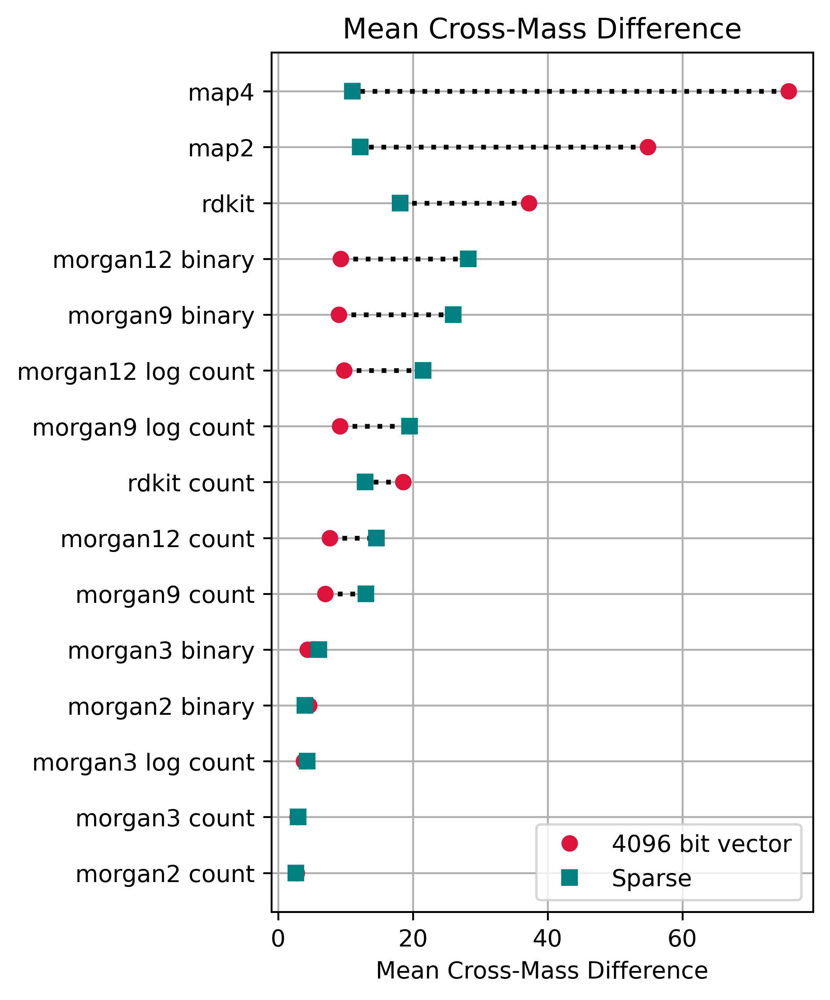

In [16]:
plot_sparse_comparison(
    results.loc[selected_experiments].MCMD,
    xlabel="Mean Cross-Mass Difference",
    title="Mean Cross-Mass Difference",
    filename="cross-mass-difference_full.png"
)
plt.show()

In [17]:
selected_experiments = {
    "Tanimoto (rdkit)": "rdkit.csv",
    "Tanimoto (rdkit count)": "rdkit_count.csv",
    "Tanimoto (MAP4)": "map4.csv",
    "Tanimoto (Morgan-3)": "morgan3_binary.csv",
    "Tanimoto (Morgan-3 count)": "morgan3_count.csv",
    "Tanimoto (Morgan-9 count)": "morgan9_count.csv",
}

selected_experiments_keys = list(selected_experiments.keys())
selected_experiments_vals = list(selected_experiments.values())

In [18]:
selected_experiments_vals

['rdkit.csv',
 'rdkit_count.csv',
 'map4.csv',
 'morgan3_binary.csv',
 'morgan3_count.csv',
 'morgan9_count.csv']

In [19]:
df

,perc_high,perc_low
0.0,1.407978,1.407978
0.5,2.936902,1.407978
1.0,3.809163,1.407978
1.5,4.923490,1.407978
2.0,5.823657,1.407978
...,...,...
98.0,99.858329,97.974620
98.5,99.897998,98.426799
99.0,99.931587,98.895045
99.5,99.964068,99.385264


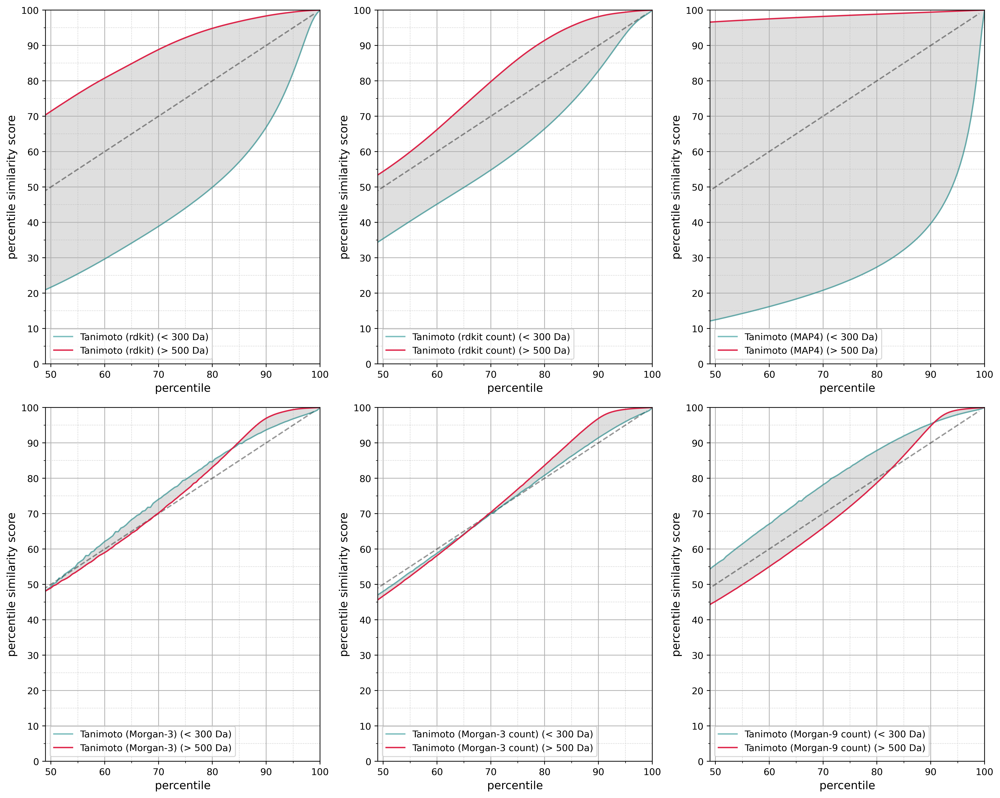

In [30]:
csv_pattern = os.path.join(path_results, "cross_mass_percentiles_*.csv")
csv_files = sorted(glob.glob(csv_pattern))

percentiles_data = np.linspace(0, 100, 201)
percentiles_ticks = [50,  60, 70, 80, 90, 100]
y_ticks = np.arange(0, 110, 10)

mass_low = 300
mass_high = 500


# Compare selected percentiles
fig, axes = plt.subplots(2, 3, figsize=(15, 12), dpi=400)
axes = axes.ravel()

colors = ["darkblue", "#277DA1", #"#4D908E", 
          "#F94144", "#F8961E", "#F9C74F"]

curves =  {key: {} for key in selected_experiments_keys}

x_low = 49
x_high = 100
y_low = 0
y_high = 100


for file in csv_files:
    for i, exp in enumerate(selected_experiments_vals):
        if exp in file:
            
            key = selected_experiments_keys[i]
            df = pd.read_csv(file)
            df.index = percentiles_data

            curves[key][mass_low] = df.perc_low
            axes[i].plot(np.arange(0, 100), np.arange(0, 100), "--", color="black", alpha=0.4)

            axes[i].plot(
                percentiles_data, df.perc_low,
                #"--", #markersize=8,
                label=key+f" (< {mass_low} Da)", color="teal", alpha=0.5
            )
            curves[key][mass_high] = df.perc_high
            axes[i].plot(
                percentiles_data, df.perc_high,
                #"--", #markersize=8,
                label=key+f" (> {mass_high} Da)", color="crimson", alpha=0.9
            )

for i, key in enumerate(selected_experiments_keys):
    axes[i].fill_between(
        percentiles_data,
        curves[key][mass_low], curves[key][mass_high], color="gray", alpha=0.25)

    axes[i].set_xticks(percentiles_ticks, [str(x) for x in percentiles_ticks])
    axes[i].set_yticks(y_ticks, [str(y) for y in y_ticks])
    axes[i].grid(True)
    ax = axes[i]
    minor_yticks = np.arange(y_low + 5, y_high, 10)
    minor_xticks = np.arange(55, x_high, 10)
    ax.set_yticks(minor_yticks, minor=True)
    ax.set_xticks(minor_xticks, minor=True)
    ax.grid(which='minor', linestyle=':', linewidth=0.7, alpha=0.7)
    
    axes[i].set_xlabel("percentile", fontsize=12)
    axes[i].set_ylabel("percentile similarity score", fontsize=12)
    axes[i].set_ylim(y_low, y_high)
    axes[i].set_xlim(x_low, x_high)
    axes[i].legend(fontsize=10, loc="lower left")

plt.tight_layout()
plt.savefig("fig_low_high_mass_score_percentiles_scaled.pdf")
plt.savefig("fig_low_high_mass_score_percentiles_scaled.png", dpi=450)
plt.show()

In [31]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

csv_pattern = os.path.join(path_results, "cross_mass_percentiles_*.csv")
csv_files = sorted(glob.glob(csv_pattern))

percentiles = np.linspace(0, 100, 201)

if not csv_files:
    print("No CSV files found in", path_results)
else:
    nfiles = len(csv_files)

    ncols = 4
    nrows = int(np.ceil(nfiles / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows), dpi=300)

    if nfiles == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    mean_differences = {}
    mean_differences_top50 = {}

    for ax, csv_file in zip(axes, csv_files):

        df = pd.read_csv(csv_file)
        df.index = percentiles
        # Extract experiment name from filename, e.g., "cross_mass_percentiles_experiment1.csv"
        experiment_name = os.path.basename(csv_file).replace("cross_mass_percentiles_", "").replace(".csv", "")
        
        # Plot the high-mass and low-mass curves
        ax.plot(df.index, df['perc_high'], label="High mass", linestyle="--", color="teal")
        ax.plot(df.index, df['perc_low'], label="Low mass", linestyle="--", color="crimson")
        # Fill the area between the curves
        ax.fill_between(df.index, df['perc_low'], df['perc_high'], color="gray", alpha=0.3)
        
        ax.set_title(experiment_name)
        ax.set_xlabel("Percentile")
        ax.set_ylabel("Scaled Similarity Score")
        ax.grid(True)
        ax.legend()
        
        # Compute and store the mean absolute difference between the curves
        mean_diff = np.abs(df['perc_high'] - df['perc_low']).mean()
        mean_differences[experiment_name] = mean_diff
        half = int(len(percentiles)/2)
        mean_differences_top50[experiment_name] = np.abs(df['perc_high'].values[half:] - df['perc_low'].values[half:]).mean()

        # Display the mean difference on the subplot
        ax.text(0.05, 0.95, f"Mean diff: {mean_diff:.2f}",
                transform=ax.transAxes, fontsize=10,
                verticalalignment='top',
                bbox=dict(boxstyle="round", facecolor="white", alpha=0.5))
    
    # Remove any extra unused subplots
    for j in range(len(csv_files), len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    output_fig = os.path.join(path_results, "all_experiments_percentile_curves.png")
    plt.savefig(output_fig, dpi=300)
    plt.show()

    # Print the mean differences for all experiments
    print("Mean differences per experiment:")
    for exp, diff in mean_differences.items():
        print(f"  {exp}: {diff:.2f}")


Mean differences per experiment:
  map2: 54.85
  map2_sparse: 12.19
  map4: 75.76
  map4_sparse: 11.01
  mbp2: 62.53
  mbp2_binned: 44.02
  mbp2_binned_count: 44.02
  mbp2_binned_count_sparse: 8.19
  mbp2_binned_sparse: 6.24
  mbp2_count: 62.53
  mbp2_count_sparse: 4.15
  mbp2_sparse: 6.50
  morgan12_binary: 9.27
  morgan12_binary_sparse: 28.20
  morgan12_count: 7.64
  morgan12_count_sparse: 14.55
  morgan12_logcount: 9.76
  morgan12_logcount_sparse: 21.49
  morgan2_binary: 4.59
  morgan2_binary_sparse: 3.98
  morgan2_count: 2.75
  morgan2_count_sparse: 2.62
  morgan3_binary: 4.37
  morgan3_binary_sparse: 6.03
  morgan3_count: 2.83
  morgan3_count_sparse: 2.95
  morgan3_logcount: 3.81
  morgan3_logcount_sparse: 4.27
  morgan9_binary: 8.98
  morgan9_binary_sparse: 25.98
  morgan9_count: 7.00
  morgan9_count_sparse: 13.01
  morgan9_logcount: 9.17
  morgan9_logcount_sparse: 19.48
  rdkit: 37.20
  rdkit_count: 18.53
  rdkit_count_sparse: 12.92
  rdkit_sparse: 18.12
